In [1]:
import pygmt
import pandas as pd
import geopandas
import cmcrameri.cm as cmc
import numpy as np
from matplotlib.colors import rgb2hex
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from pdf2image import convert_from_path

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


In [2]:

pygmt.config(FONT="16p")


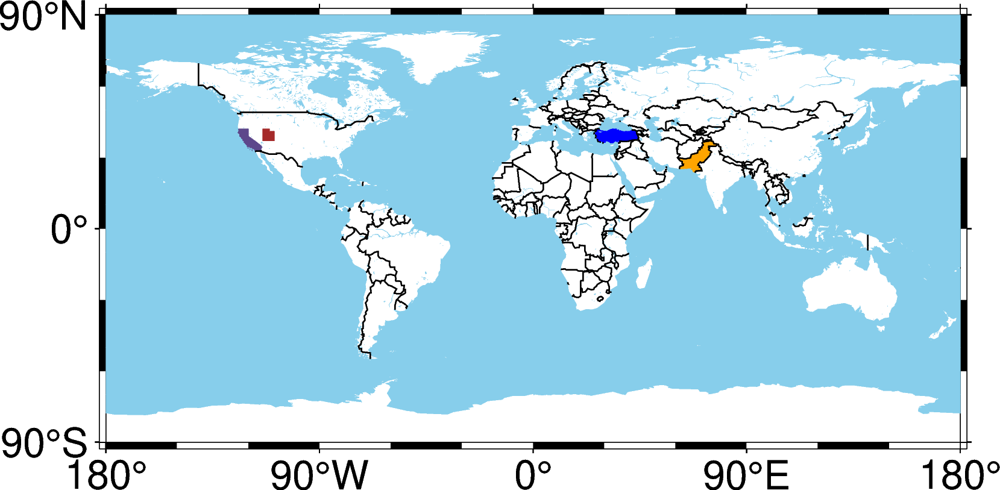

In [3]:
fig = pygmt.Figure()
fig.basemap(region="d", projection="Q12c", frame=True)
#fig.grdimage("@srtm_relief_03s", shading=True, cmap='geo')
fig.coast(borders=["1/0.5p,black"], water="skyblue",dcw=["Turkey+gblue","Pakistan+gorange","US.CA+gmediumpurple4","US.UT+gbrown"])
#fig.plot(x=[-124.5,-114,-114,-124.5,-124.5],y=[32.2,32.2,42.1,42.1,32.2],pen="1p,mediumpurple4")
#fig.plot(x=[25,45,45,25,25],y=[35,35,43,43,35],pen="1p,blue")
#fig.plot(x=[60,79,79,60,60],y=[23,23,38,38,23],pen="1p,orange")
fig.savefig("../../Maps/world_map_of_creepmeter_installations.pdf")
fig.savefig("../../Maps/world_map_of_creepmeter_installations.png")
fig.show()

Create map for all of California

In [3]:
creepmeters = pd.read_excel('../../Data/creepmeter_lookup_and_processing_progress.xlsx',index_col=0)
Cali = creepmeters.drop(creepmeters[creepmeters["Region"]!="California"].index)
Cali.drop_duplicates(subset="Creepmeter_abbrv",inplace=True)

gdf = geopandas.read_file("../../Data/GIS_Files/Shapefile/QFaults.shp")
#gdf.drop(gdf[gdf.Location!='California'].index,inplace=True)

Cali.drop([21,23,24,26,33,39,40],inplace=True)
Cali["Creepmeter_abbrv"].loc[38]="XPK1/2"
Cali["Creepmeter_abbrv"].loc[27]="CWN1/CWC3"
Cali["Creepmeter_abbrv"].loc[22]="XSJ2/3"
Cali["Creepmeter_abbrv"].loc[25]="XHR1/2/3"

park = Cali.drop(Cali[Cali["Sub_region_map"]!="Parkfield"].index)
Hay = Cali.drop(Cali[Cali["Sub_region_map"]!="Hayward"].index)
Hol = Cali.drop(Cali[Cali["Sub_region_map"]!="Hollister"].index)
Sal = Cali.drop(Cali[Cali["Sub_region_map"]!="SoCal"].index)

#park.drop(park[park['Picked']!="Yes"].index,inplace=True)
park.drop(park[park['Creepmeter_abbrv']=="XMBC"].index,inplace=True)
park.drop(park[park['Creepmeter_abbrv']=="TABC"].index,inplace=True)

/var/folders/56/47k8q3q1449cq8kwzkz5r8ch0000gr/T/ipykernel_2541/3851371508.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Cali["Creepmeter_abbrv"].loc[38]="XPK1/2"
/var/folders/56/47k8q3q1449cq8kwzkz5r8ch0000gr/T/ipykernel_2541/3851371508.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Cali["Creepmeter_abbrv"].loc[27]="CWN1/CWC3"
/var/folders/56/47k8q3q1449cq8kwzkz5r8ch0000gr/T/ipykernel_2541/3851371508.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#re

In [4]:
full_colours_list = []
full_colours_list.append('red')

cmap = cmc.imola #select the colormap
slicedCM = cmap(np.linspace(0.1, 0.4, 4))
for i in range(len(slicedCM)):
    full_colours_list.append(rgb2hex(slicedCM[i]))


cmap = cmc.bam #select the colormap
slicedCM = cmap(np.linspace(0, 0.3, len(Hay)))
for i in range(len(slicedCM)):
    full_colours_list.append(rgb2hex(slicedCM[i]))

cmap = cmc.acton #select the colormap
slicedCM = cmap(np.linspace(0.1, 0.5, len(Hol)))
for i in range(len(slicedCM)):
    full_colours_list.append(rgb2hex(slicedCM[i]))

cmap = cmc.lajolla #select the colormap
slicedCM = cmap(np.linspace(0.25, 0.75, len(park)))
for i in range(len(slicedCM)):
    full_colours_list.append(rgb2hex(slicedCM[i]))

cmap = cmc.buda #select the colormap
slicedCM = cmap(np.linspace(0.6, 1, len(Sal)))
for i in range(len(slicedCM)):
    full_colours_list.append(rgb2hex(slicedCM[i]))

with open('../../Data/creepmeter_colours.txt', 'w') as f:
    for line in full_colours_list:
        f.write("%s\n" % line)

plotting Hayward fault CMs
plotting Hollister
plotting Parkfield
plotting Salton Sea


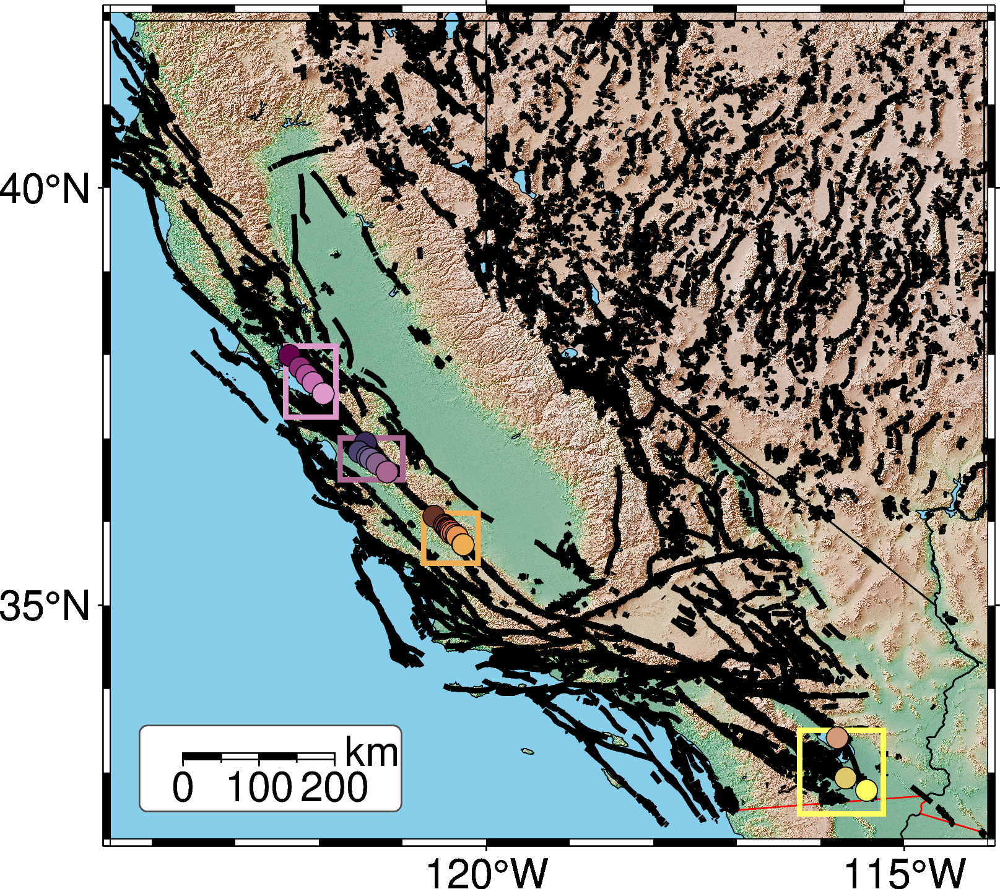

In [41]:
fig = pygmt.Figure()
fig.basemap(region=[-124.5,-114,32.2,42.1], projection="Q12c", frame=True,map_scale="jBL+o1c/1c+c-7+w200k+f+lkm+ar",
            box="+gwhite@30+p0.5p,gray30,solid+r3p",)
fig.grdimage("@srtm_relief_03s", shading=True, cmap='elevation')
fig.coast(borders=["1/0.5p,red", "2/0.5p,black", "3/0.5p,blue"],shorelines=True,water='skyblue')
fig.plot(data=gdf,pen="2p,black")
fig.basemap(region=[-124.5,-114,32.2,42.1], projection="Q12c", frame=True,map_scale="jBL+o1c/1c+c-7+w200k+f+lkm+ar",
            box="+gwhite@30+p0.5p,gray30,solid+r3p",)

for i in range(len(Cali)):
    fig.plot(x=Cali.Longitude.iloc[i], y=Cali.Latitude.iloc[i], style="c0.2c", pen="black",fill="pink")
all_box_colours = []
print('plotting Hayward fault CMs')
cmap = cmc.bam #select the colormap
slicedCM = cmap(np.linspace(0, 0.3, len(Hay)))
all_box_colours.append(rgb2hex(slicedCM[-1]))
fig.plot(x=[-122.4,-121.8,-121.8,-122.4,-122.4],y=[37.25,37.25,38.1,38.1,37.25],pen="2p,{k}".format(k=rgb2hex(slicedCM[-1])))
for i in range(len(Hay)):
    fig.plot(x=Hay.Longitude.iloc[i], y=Hay.Latitude.iloc[i], style="c0.3c", pen="black",fill=rgb2hex(slicedCM[i]))


print('plotting Hollister')
cmap = cmc.acton #select the colormap
slicedCM = cmap(np.linspace(0.1, 0.5, len(Hol)))
all_box_colours.append(rgb2hex(slicedCM[-1]))
fig.plot(x=[-121.75,-121,-121,-121.75,-121.75],y=[36.5,36.5,37,37,36.5],pen="2p,{k}".format(k=rgb2hex(slicedCM[-1])))
for i in range(len(Hol)):
    fig.plot(x=Hol.Longitude.iloc[i], y=Hol.Latitude.iloc[i], style="c0.3c", pen="black",fill=rgb2hex(slicedCM[i]))

print('plotting Parkfield')
cmap = cmc.lajolla #select the colormap
slicedCM = cmap(np.linspace(0.25, 0.75, len(park)))
all_box_colours.append(rgb2hex(slicedCM[-1]))
fig.plot(x=[-120.75,-120.1,-120.1,-120.75,-120.75],y=[35.5,35.5,36.1,36.1,35.5],pen="2p,{k}".format(k=rgb2hex(slicedCM[-1])))
for i in range(len(park)):
    fig.plot(x=park.Longitude.iloc[i], y=park.Latitude.iloc[i], style="c0.3c", pen="black",fill=rgb2hex(slicedCM[i]))

print('plotting Salton Sea')
cmap = cmc.buda #select the colormap
slicedCM = cmap(np.linspace(0.6, 1, len(Sal)))
all_box_colours.append(rgb2hex(slicedCM[-1]))
fig.plot(x=[-116.25,-115.25,-115.25,-116.25,-116.25],y=[32.5,32.5,33.5,33.5,32.5],pen="2p,{k}".format(k=rgb2hex(slicedCM[-1])))
for i in range(len(Sal)):
    fig.plot(x=Sal.Longitude.iloc[i], y=Sal.Latitude.iloc[i], style="c0.3c", pen="black",fill=rgb2hex(slicedCM[i]))
fig.savefig("../../Maps/California_creepmeters_Colour_coded.pdf")
fig.savefig("../../Maps/California_creepmeters_Colour_coded.png")
fig.show()

In [58]:
California_map = convert_from_path("../../Maps/California_creepmeters_Colour_coded.pdf", dpi=1200)[0]  # Extract the first page as an image
World_map  = convert_from_path("../../Maps/world_map_of_creepmeter_installations.pdf", dpi=1200)[0]
%matplotlib qt
plt.close('all')
fig= plt.figure()
ax = plt.subplot(1,2,1)
ax.imshow(World_map)
ax.axis('off')
plt.tight_layout()
ax2 = plt.subplot(1,2,2)
ax2.imshow(California_map)
ax2.annotate('Hayward',xy=(2200, 2500),xytext=(3000, 2000),fontsize=11,color='black',\
             bbox=dict(boxstyle="round",edgecolor=all_box_colours[0],facecolor='white'),\
            arrowprops=dict(arrowstyle="-|>", color=all_box_colours[0]))
ax2.annotate('Hollister',xy=(2500, 3000),xytext=(4000, 2750),fontsize=11,color='black',\
             bbox=dict(boxstyle="round",edgecolor=all_box_colours[1],facecolor='white'),\
            arrowprops=dict(arrowstyle="-|>", color=all_box_colours[1]))
ax2.annotate('Parkfield',xy=(3000, 3500),xytext=(4500, 3500),fontsize=11,color='black',\
             bbox=dict(boxstyle="round",edgecolor=all_box_colours[2],facecolor='white'),\
            arrowprops=dict(arrowstyle="-|>", color=all_box_colours[2]))
ax2.annotate('Salton Sea',xy=(5000, 5000),xytext=(3000, 4500),fontsize=11,color='black',\
             bbox=dict(boxstyle="round",edgecolor=all_box_colours[3],facecolor='white'),\
            arrowprops=dict(arrowstyle="-|>", color=all_box_colours[3]))
ax2.axis('off')
plt.tight_layout()
fig.tight_layout()
fig.text(0.05,0.7,'a)',bbox=dict(boxstyle="round",edgecolor='black',facecolor='white'))
fig.text(0.5,0.7,'b)',bbox=dict(boxstyle="round",edgecolor='black',facecolor='white'))
plt.savefig("../../Maps/catalogue_map_figure_1.pdf")
plt.show()

Smaller map of Parkfield

In [5]:
pygmt.config(FONT="12p")

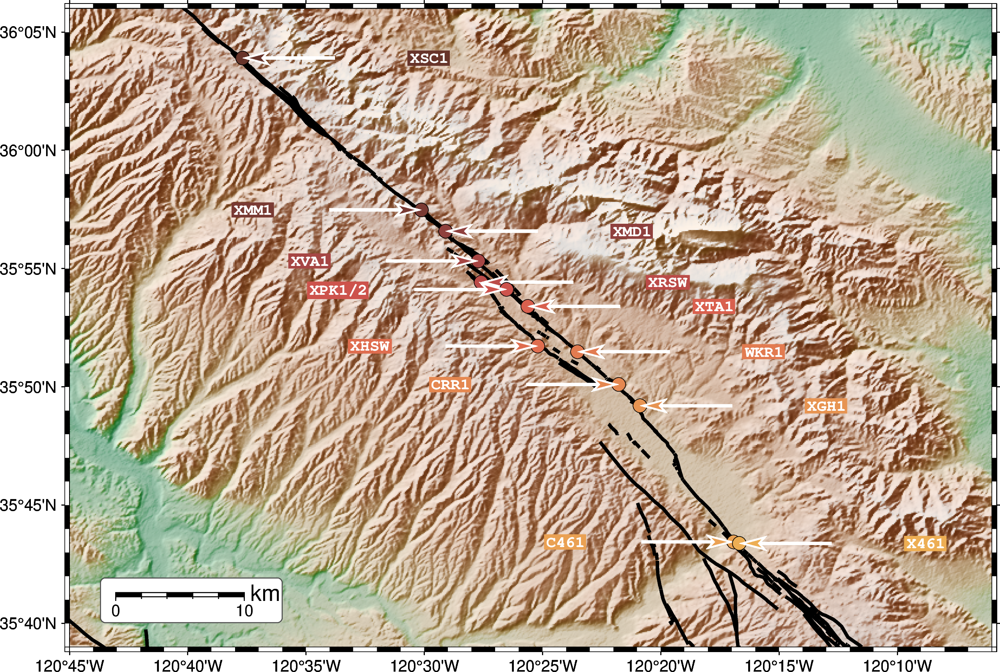

In [7]:
region = [-120.75,-120.1,35.65,36.1]
projection = "Q20c"
fig = pygmt.Figure()
fig.subplot(nrows=1, ncols=1, figsize=("20c", "8c"), frame="lrtb")
fig.basemap(region=region, projection=projection, frame=True,map_scale="jBL+o1c/1c+c-7+w10k+f+lkm+ar",
            box="+gwhite@30+p0.5p,gray30,solid+r3p",)
fig.grdimage("@srtm_relief_03s", shading=True, cmap='elevation')
fig.coast(borders=["1/0.5p,red", "2/0.5p,black", "3/0.5p,blue"],shorelines=True,water='skyblue')
fig.plot(data=gdf,pen="2p,black")
fig.basemap(region=region, projection=projection, frame=True,map_scale="jBL+o1c/1c+c-7+w10k+f+lkm+ar",
            box="+gwhite@30+p0.5p,gray30,solid+r3p",)

cmap = cmc.lajolla #select the colormap
slicedCM = cmap(np.linspace(0.25, 0.75, len(park)))
for i in range(len(park)):
    if (i % 2) == 0:
        j=0
        k=+0.125
    else:
        j=180
        k=-0.125
    fig.plot(x=park.Longitude.iloc[i], y=park.Latitude.iloc[i], style="c0.3c", pen="black",fill=rgb2hex(slicedCM[i]))
    fig.plot(x=park.Longitude.iloc[i], y=park.Latitude.iloc[i], style="v0.6c+b", direction=([j], [2]), pen="2p,white", fill=rgb2hex(slicedCM[i]))
    fig.text(x=park.Longitude.iloc[i]+k, y=park.Latitude.iloc[i], text=park['Creepmeter_abbrv'].iloc[i], font="Courier-Bold,white", \
             justify="MC", offset="0.2c/0c",fill=rgb2hex(slicedCM[i]))
#fig.savefig("../../Maps/Parkfield_creepmeters_labelled.pdf")
fig.show()

Smaller map near San Juan Bautista

In [3]:
pygmt.config(FONT="14p")

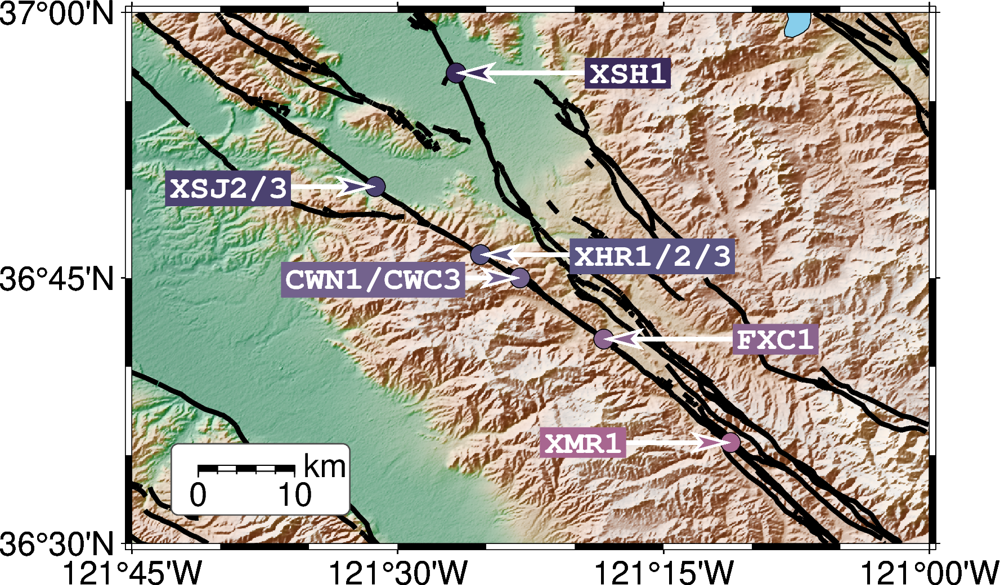

In [17]:
region = [-121.75,-121,36.5,37]
fig = pygmt.Figure()
fig.subplot(nrows=1, ncols=1, figsize=("20c", "8c"), frame="lrtb",margin=["1c", "1c", "1c", "1c"])
fig.basemap(region=region, projection="Q12c", frame=True,map_scale="jTR+o1c/1c+c-7+w10k+f+lkm+ar",
            box="+gwhite@30+p0.5p,gray30,solid+r3p",)
fig.grdimage("@srtm_relief_03s", shading=True, cmap='elevation')
fig.coast(borders=["1/0.5p,red", "2/0.5p,black", "3/0.5p,blue"],shorelines=True,water='skyblue')
fig.plot(data=gdf,pen="2p,black")
fig.basemap(region=region, projection="Q12c", frame=True,map_scale="jBL+o1c/1c+c-7+w10k+f+lkm+ar",
            box="+gwhite@30+p0.5p,gray30,solid+r3p",)

cmap = cmc.acton #select the colormap
slicedCM = cmap(np.linspace(0.1, 0.5, len(Hol)))
for i in range(len(Hol)):
    if (i % 2) == 0:
        j=0
        k=+0.15
    else:
        j=180
        k=-0.15
    fig.plot(x=Hol.Longitude.iloc[i], y=Hol.Latitude.iloc[i], style="c0.3c", pen="black",fill=rgb2hex(slicedCM[i]))
    fig.plot(x=Hol.Longitude.iloc[i], y=Hol.Latitude.iloc[i], style="v0.6c+b", direction=([j], [2]), pen="2p,white", fill=rgb2hex(slicedCM[i]))
    fig.text(x=Hol.Longitude.iloc[i]+k, y=Hol.Latitude.iloc[i], text=Hol['Creepmeter_abbrv'].iloc[i], font="Courier-Bold,white", \
             justify="MC", offset="0.2c/0c",fill=rgb2hex(slicedCM[i]))


'''for i in range(len(Cali)):
    fig.plot(x=Cali.Longitude.iloc[i], y=Cali.Latitude.iloc[i], style="c0.3c", pen="black",fill='purple')
'''
#fig.savefig("../../Maps/Hollister_creepmeters_labelled.pdf")
fig.show()

smaller map for the Hayward Fault

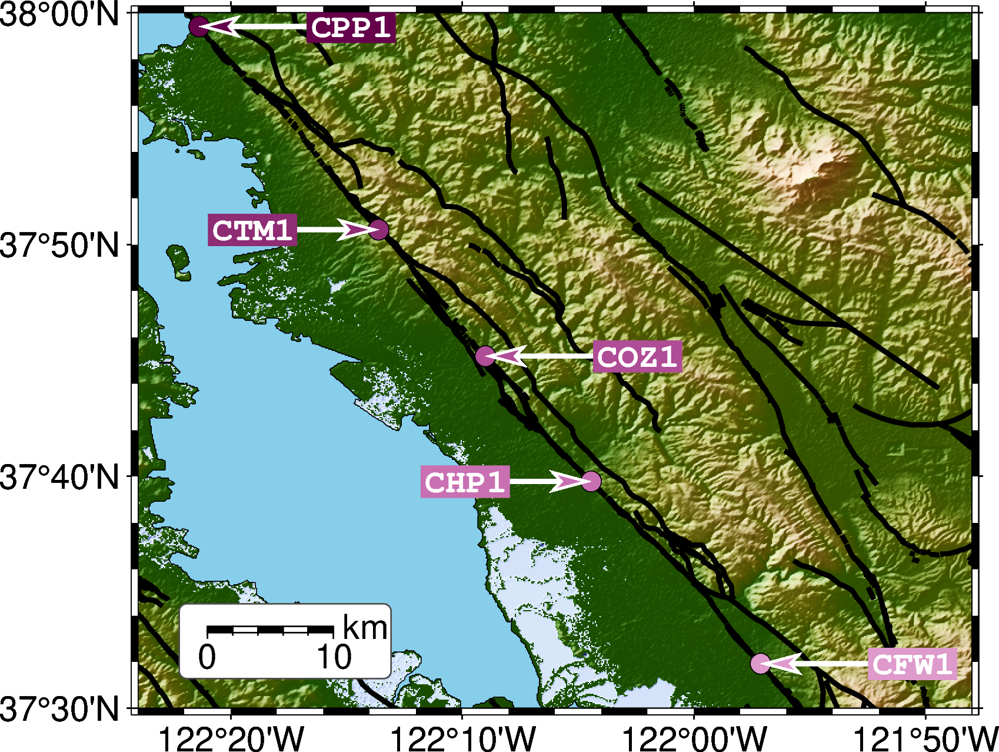

In [6]:
region = [-122.4,-121.8,37.5,38]
fig = pygmt.Figure()
fig.subplot(nrows=1, ncols=1, figsize=("20c", "8c"), frame="lrtb")

fig.basemap(region=region, projection="Q12c", frame=True,map_scale="jBL+o1c/1c+c-7+w10k+f+lkm+ar",
            box="+gwhite@30+p0.5p,gray30,solid+r3p",)
fig.grdimage("@srtm_relief_03s", shading=True, cmap='elevation')
fig.coast(borders=["1/0.5p,red", "2/0.5p,black", "3/0.5p,blue"],shorelines=True,water='skyblue')
fig.plot(data=gdf,pen="2p,black")
fig.basemap(region=region, projection="Q12c", frame=True,map_scale="jBL+o1c/1c+c-7+w10k+f+lkm+ar",
            box="+gwhite@30+p0.5p,gray30,solid+r3p",)

cmap = cmc.bam #select the colormap
slicedCM = cmap(np.linspace(0, 0.3, len(Hay)))
for i in range(len(Hay)):
    if (i % 2) == 0:
        j=0
        k=+0.1
    else:
        j=180
        k=-0.1
    fig.plot(x=Hay.Longitude.iloc[i], y=Hay.Latitude.iloc[i], style="c0.3c", pen="black",fill=rgb2hex(slicedCM[i]))
    fig.plot(x=Hay.Longitude.iloc[i], y=Hay.Latitude.iloc[i], style="v0.6c+b", direction=([j], [2]), pen="2p,white", fill=rgb2hex(slicedCM[i]))
    fig.text(x=Hay.Longitude.iloc[i]+k, y=Hay.Latitude.iloc[i], text=Hay['Creepmeter_abbrv'].iloc[i], font="Courier-Bold,white", \
             justify="MC", offset="0.2c/0c",fill=rgb2hex(slicedCM[i]))


'''for i in range(len(Cali)):
    fig.plot(x=Cali.Longitude.iloc[i], y=Cali.Latitude.iloc[i], style="c0.3c", pen="black",fill="pink")
'''
fig.savefig("../../Maps/Hayward_creepmeters_labelled.pdf")
fig.show()

smaller map for the southern Cali

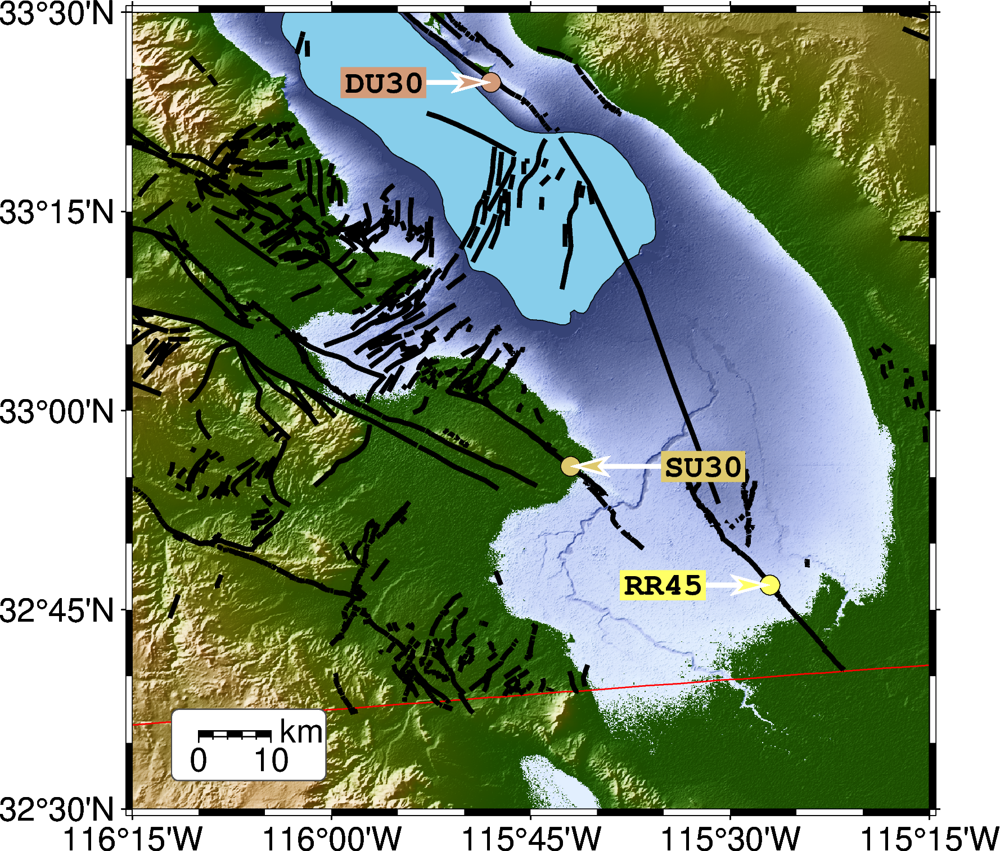

In [7]:
region = [-116.25,-115.25,32.5,33.5]
fig = pygmt.Figure()
fig.subplot(nrows=1, ncols=1, figsize=("20c", "8c"), frame="lrtb")

fig.basemap(region=region, projection="Q12c", frame=True,map_scale="jBL+o1c/1c+c-7+w10k+f+lkm+ar",
            box="+gwhite@30+p0.5p,gray30,solid+r3p",)
fig.grdimage("@srtm_relief_03s", shading=True, cmap='elevation')
fig.coast(borders=["1/0.5p,red", "2/0.5p,black", "3/0.5p,blue"],shorelines=True,water='skyblue')
fig.plot(data=gdf,pen="2p,black")
fig.basemap(region=region, projection="Q12c", frame=True,map_scale="jBL+o1c/1c+c-7+w10k+f+lkm+ar",
            box="+gwhite@30+p0.5p,gray30,solid+r3p",)

cmap = cmc.buda #select the colormap
slicedCM = cmap(np.linspace(0.6, 1, len(Sal)))
for i in range(len(Sal)):
    if (i % 2) == 0:
        j=180
        k=-0.15
    else:
        j=0
        k=+0.15
    fig.plot(x=Sal.Longitude.iloc[i], y=Sal.Latitude.iloc[i], style="c0.3c", pen="black",fill=rgb2hex(slicedCM[i]))
    fig.plot(x=Sal.Longitude.iloc[i], y=Sal.Latitude.iloc[i], style="v0.6c+b", direction=([j], [2]), pen="2p,white", fill=rgb2hex(slicedCM[i]))
    fig.text(x=Sal.Longitude.iloc[i]+k, y=Sal.Latitude.iloc[i], text=Sal['Creepmeter_abbrv'].iloc[i], font="Courier-Bold,black", \
             justify="MC", offset="0.2c/0c",fill=rgb2hex(slicedCM[i]))


'''for i in range(len(Cali)):
    fig.plot(x=Cali.Longitude.iloc[i], y=Cali.Latitude.iloc[i], style="c0.3c", pen="black",fill='gold1')
'''
fig.savefig("../../Maps/SoCal_creepmeters_labelled.pdf")
fig.show()

Turkey

In [10]:
Turk = creepmeters.drop(creepmeters[creepmeters["Region"]!="Turkey"].index)
Turk.drop_duplicates(subset="Creepmeter_abbrv",inplace=True)
#Turk = Turk.drop(Turk[Turk["Creepmeter_abbrv"]=="SRI1"].index)
gdf_T = geopandas.read_file("../../Data/GIS_Files/AFEAD_v2022/AFEAD_v2022.shp")
Turk_cropped = Turk.copy(deep=True)
Turk_cropped["Creepmeter_abbrv"].loc[2]="INW1/ISW1/WSZ1"
Turk_cropped.drop([4,5],inplace=True)
print(Turk_cropped)

       Region         Sub_region_map                Network  \
Index                                                         
1      Turkey   East_Anatolian_Fault   East_Anatolian_Fault   
2      Turkey  North_Anatolian_Fault  North_Anatolian_Fault   

       Creepmeter_full_name Creepmeter_abbrv File_code  \
Index                                                    
1                   Srivice             SRI1     sri_0   
2      Ismetpasa North Wall   INW1/ISW1/WSZ1     inw_0   

                        Start Time                     End Time  \
Index                                                             
1      2020-02-05T11:48:00.000000Z  2023-12-02T11:19:00.000000Z   
2      2014-05-22T00:38:00.000000Z  2019-10-08T09:08:00.000000Z   

       Sampling rate, Hz  Sampling rate, mins  ...  Cov_max_duration_Fixed  \
Index                                          ...                           
1               0.016667                    1  ...                      NO   
2          

/var/folders/56/47k8q3q1449cq8kwzkz5r8ch0000gr/T/ipykernel_29598/1046856748.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Turk_cropped["Creepmeter_abbrv"].loc[2]="INW1/ISW1/WSZ1"


plot [WARNING]: Bad OGR/GMT: @D record has more items than declared by @N
plot [WARNING]: Bad OGR/GMT: @D record has more items than declared by @N
plot [WARNING]: Bad OGR/GMT: @D record has more items than declared by @N


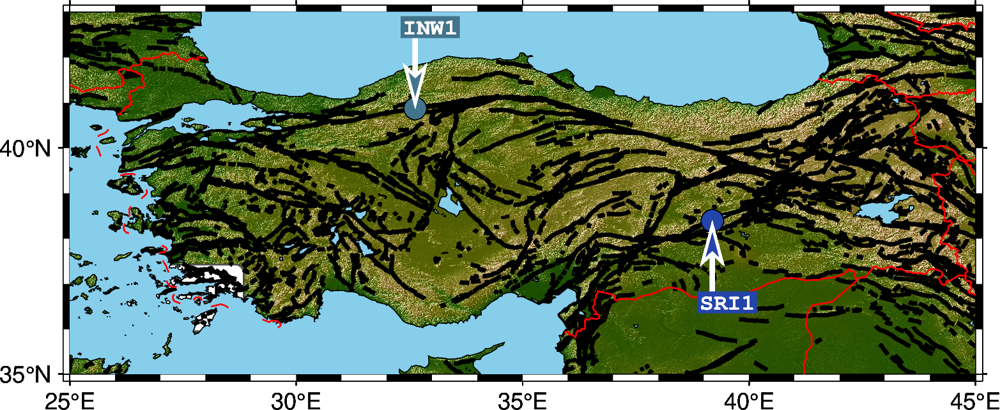

In [13]:
region=[25,45,35,43]
fig = pygmt.Figure()
fig.subplot(nrows=1, ncols=1, figsize=("20c", "8c"), frame="lrtb")

fig.basemap(region=region, projection="Q12c", frame=True,map_scale="jBL+o1c/1c+c-7+w100k+f+lkm+ar",
            box="+gwhite@30+p0.5p,gray30,solid+r3p",)
fig.grdimage("@srtm_relief_03s", shading=True, cmap='elevation')
fig.basemap(region=region, projection="Q12c", frame=True,map_scale="jBL+o1c/1c+c-7+w100k+f+lkm+ar",
            box="+gwhite@30+p0.5p,gray30,solid+r3p",)
fig.plot(data=gdf_T,pen="1.5p,black")
fig.coast(borders=["1/0.5p,red", "2/0.5p,black", "3/0.5p,blue"],shorelines=True,water='skyblue')

#fig.plot(x=[32,33,33,32,32],y=[40.5,40.5,41.25,41.25,40.5],pen="2p,blue")
#fig.plot(x=[38.5,39.5,39.5,38.5,38.5],y=[37.75,37.75,38.75,38.75,37.75],pen="2p,darkslategray2")

cmap = cmc.imola #select the colormap
slicedCM = cmap(np.linspace(0.1, 0.4, len(Turk_cropped)))
for i in range(len(Turk_cropped)):
    if (i % 2) == 0:
        j=270
        k=-1.8
    else:
        j=90
        k=+1.8
    fig.plot(x=Turk_cropped.Longitude.iloc[i], y=Turk_cropped.Latitude.iloc[i], style="c0.3c", pen="black",fill=rgb2hex(slicedCM[i]))
    fig.plot(x=Turk_cropped.Longitude.iloc[i], y=Turk_cropped.Latitude.iloc[i], style="v0.6c+b", direction=([j], [1]), pen="2p,white", fill=rgb2hex(slicedCM[i]))
    fig.text(x=Turk_cropped.Longitude.iloc[i], y=Turk_cropped.Latitude.iloc[i]+k, text=Turk_cropped['Creepmeter_abbrv'].iloc[i], font="Courier-Bold,white", \
             justify="MC", offset="0.2c/0c",fill=rgb2hex(slicedCM[i]))

'''for i in range(len(Turk)):
    fig.plot(x=Turk.Longitude.iloc[i], y=Turk.Latitude.iloc[i], style="c0.2c", pen="black",fill="blue")
'''
#fig.savefig("../../Maps/Turkey_creepmeters_labelled.pdf")
fig.show()

In [14]:
Turk['Longitude']

Index
1    39.1873
2    32.6258
4    32.6258
5    32.6194
Name: Longitude, dtype: float64

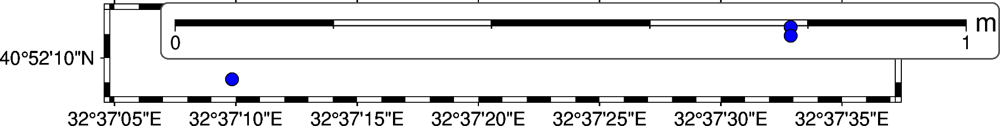

In [15]:
region=[32.618,32.627,40.869,40.87]
fig = pygmt.Figure()
fig.basemap(region=region, projection="Q12c", frame=True,map_scale="jBL+o1c/1c+c-7+w1+f+lm+ar",
            box="+gwhite@30+p0.5p,gray30,solid+r3p",)
#fig.grdimage("@srtm_relief_03s", shading=True, cmap='geo')
fig.basemap(region=region, projection="Q12c", frame=True,map_scale="jBL+o1c/1c+c-7+w1+f+lm+ar",
            box="+gwhite@30+p0.5p,gray30,solid+r3p",)
#fig.plot(data=gdf_T,pen="1.5p,black")
fig.coast(borders=["1/0.5p,red", "2/0.5p,black", "3/0.5p,blue"],shorelines=True,water='skyblue')

#fig.plot(x=[32,33,33,32,32],y=[40.5,40.5,41.25,41.25,40.5],pen="2p,blue")
#fig.plot(x=[38.5,39.5,39.5,38.5,38.5],y=[37.75,37.75,38.75,38.75,37.75],pen="2p,darkslategray2")

for i in range(len(Turk)):
    fig.plot(x=Turk.Longitude.iloc[i], y=Turk.Latitude.iloc[i], style="c0.2c", pen="black",fill="blue")
#fig.savefig("../../Maps/Turkey_Ismetpasa_creepmeters.pdf")
fig.show()

Pakistan

In [16]:
gdf_P = geopandas.read_file("../../Data/GIS_Files/AFEAD_v2022/AFEAD_v2022.shp")
Pak = creepmeters.drop(creepmeters[creepmeters["Region"]!="Pakistan"].index)

plot [WARNING]: Bad OGR/GMT: @D record has more items than declared by @N
plot [WARNING]: Bad OGR/GMT: @D record has more items than declared by @N
plot [WARNING]: Bad OGR/GMT: @D record has more items than declared by @N


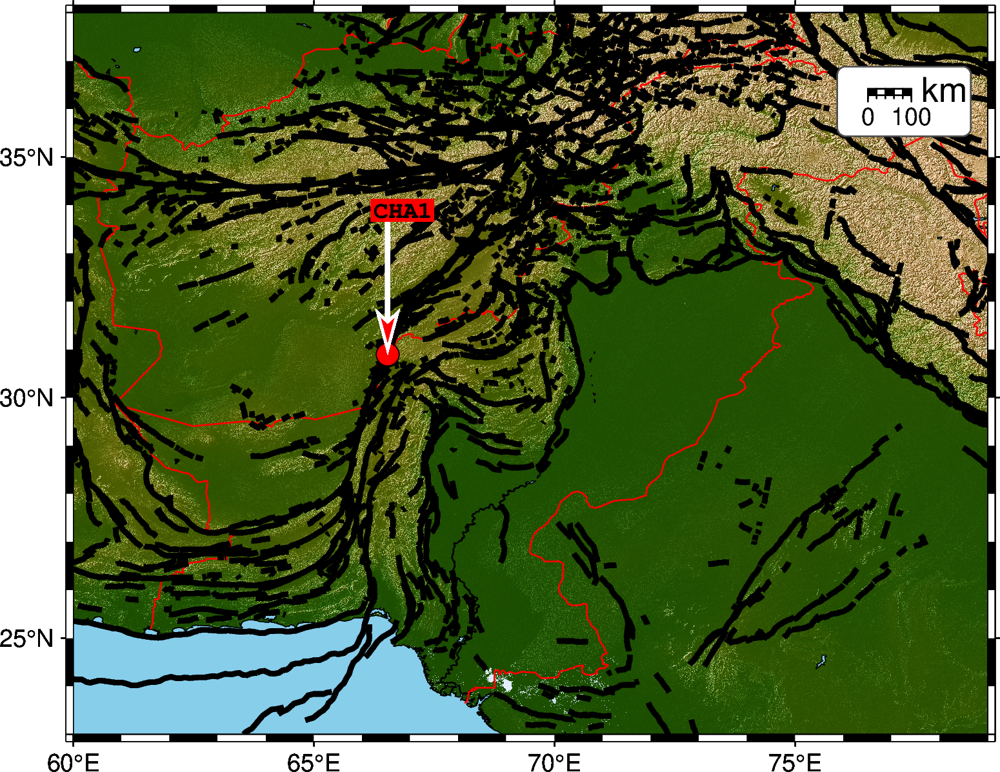

In [21]:
region = [60,79,23,38]
fig = pygmt.Figure()
fig.basemap(region=region, projection="Q12c", frame=True)
fig.grdimage("@srtm_relief_03s", shading=True, cmap='oleron')
fig.coast(borders=["1/0.5p,red", "2/0.5p,black", "3/0.5p,blue"],shorelines=True,water='skyblue')
fig.plot(data=gdf_P,pen="2p,black")
fig.basemap(region=region, projection="Q12c", frame=True,map_scale="jTR+o1c/1c+c-7+w100k+f+lkm+ar",
            box="+gwhite@30+p0.5p,gray30,solid+r3p",)



for i in range(len(Pak)):
    fig.plot(x=Pak.Longitude.iloc[i], y=Pak.Latitude.iloc[i], style="c0.3c", pen="black",fill='red')
    fig.plot(x=Pak.Longitude.iloc[i], y=Pak.Latitude.iloc[i], style="v0.6c+b", direction=([j], [2]), pen="2p,white", fill='red')
    fig.text(x=Pak.Longitude.iloc[i], y=Pak.Latitude.iloc[i]+3, text=Pak['Creepmeter_abbrv'].iloc[i], font="Courier-Bold,black", \
             justify="MC", offset="0.2c/0c",fill="red")
fig.savefig("../../Maps/Pakistan_creepmeters.pdf")
fig.show()